In [2]:
import os
import requests
from PIL import Image, ImageOps
from io import BytesIO
import ipywidgets as widgets
import IPython.display
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
import numpy as np

from vertexai.vision_models import MultiModalEmbeddingModel
mm_embedding_model = MultiModalEmbeddingModel.from_pretrained("multimodalembedding")


from menu_listing.constants import (
    GCP_PROJECT_ID, 
    PROJECT_ROOT,
    PID_RNAME_MAPPING,
    SUPPORTED_DIMS,
    QUERIES,
    get_query_vector
)

place_ids = ["ChIJO79pfG7Kj4ARTnmoiEbJKEk", "ChIJT2NxLBPKj4ARRivowJnL3Wg", "ChIJw1N0TPq1j4ARiWgSpsEurvo"]
DATE_THRESHOLD = "2024-01-01"

/Users/youjin/miniforge3/envs/menu/lib/python3.10/site-packages/vertexai/_model_garden/_model_garden_models.py:278: UserWarning: This feature is deprecated as of June 24, 2025 and will be removed on June 24, 2026. For details, see https://cloud.google.com/vertex-ai/generative-ai/docs/deprecations/genai-vertexai-sdk.
  warning_logs.show_deprecation_warning()


# Retrieve and Process Review Image Embeddings
This notebook retrieves existing embeddings from BigQuery and processes remaining images using functions defined in `menuboard_search.py`.

In [2]:
place_id = place_ids[0]
restaurant_name = PID_RNAME_MAPPING.get(place_id, "Unknown_Restaurant")
parquet_path = PROJECT_ROOT / "data" / "byproduct" / "11-embeddings" / f"{place_id}.parquet"
df = pd.read_parquet(parquet_path)
print(f"Found {len(df)} rows for {restaurant_name} (pid={place_id})")

df.head()

Found 649 rows for Kunjip (pid=ChIJO79pfG7Kj4ARTnmoiEbJKEk)


,review_id,image_url,published_date,embedding_128
0,0,https://lh3.googleusercontent.com/geougc-cs/AM...,2025-12-07,"[0.0970807076, -0.0230467822, -0.130137503, -0..."
1,0,https://lh3.googleusercontent.com/geougc-cs/AM...,2025-12-07,"[0.0226799492, -0.0292365495, -0.115962118, -0..."
2,1,https://lh3.googleusercontent.com/geougc-cs/AM...,2025-10-25,"[0.0621491894, 0.0214949176, -0.0875908956, -0..."
3,1,https://lh3.googleusercontent.com/geougc-cs/AM...,2025-10-25,"[0.0339951217, -0.0387973823, -0.116626784, 0...."
4,1,https://lh3.googleusercontent.com/geougc-cs/AM...,2025-10-25,"[0.053479109, -0.00386966462, -0.108305044, -0..."


In [48]:
# threshold by date
df = df[pd.to_datetime(df['published_date']) >= pd.to_datetime(DATE_THRESHOLD)]
print(f"Found {len(df)} rows after thresholding by date {DATE_THRESHOLD}") 

Found 318 rows after thresholding by date 2024-01-01


In [127]:
# text_query = "A photo of a full restaurant menu showing all menu items and prices, with the entire menu visible in frame and little surrounding background, organized for customer ordering."


EMBED_DIM = 128

query_purpose = 'is_menu'
query_text = QUERIES[query_purpose]['text']
query_embedding = np.array(QUERIES[query_purpose]['vector'])

# query_text = (
#     # "A straight-on overview image of an entire restaurant menu, showing all menu items and prices together in one complete, readable layout."
#     # "An overview image of a restaurant dining space capturing the interior layout and ambiance."
#     # "A street-level view of a restaurant exterior with the storefront, entrance, and clearly visible restaurant logo or sign."
#     "A detailed food photo showing plated dish or dishes as served, with textures and ingredients clearly visible."
#     # "A close view of restaurant dish or dishes showing the food itself as the primary focus of the photo."
# )
# query_embedding = mm_embedding_model.get_embeddings(
#     contextual_text=query_text,
#     dimension=EMBED_DIM
# ).text_embedding
# query_embedding = np.array(query_embedding)


print(query_text)
print(query_embedding.shape)

df['similarity'] = cosine_similarity(
    np.stack(df[f"embedding_{EMBED_DIM}"].values), 
    query_embedding.reshape(1, -1)
).flatten()

df_sorted = df.sort_values(by='similarity', ascending=False).drop(columns=[col for col in df.columns if col.startswith('embedding_') if col != f'embedding_{EMBED_DIM}'])

similarities = df_sorted['similarity'].tolist()
for p in [0, 25, 50, 75, 100]:
    print(f"{p} percentile: {np.percentile(similarities, p)}")

A detailed food photo showing plated dish or dishes as served, with textures and ingredients clearly visible.
(128,)
0 percentile: 0.20704921538256868
25 percentile: 0.26735365683506046
50 percentile: 0.27797322921432427
75 percentile: 0.29073110834515253
100 percentile: 0.3337251215605084


## Show top-K results in a single plot

In [128]:
num_show = 30
top_images = []
bottom_images = []
for i in range(num_show):
    for idx, lst in [(i, top_images), (len(df_sorted) - i - 1, bottom_images)]:
        row = df_sorted.iloc[idx]
        response = requests.get(row['image_url'].replace("=s1024","=s200"))
        image = Image.open(BytesIO(response.content))
        lst.append((image, row['similarity'], row['published_date']))
print(image.size)

(200, 150)


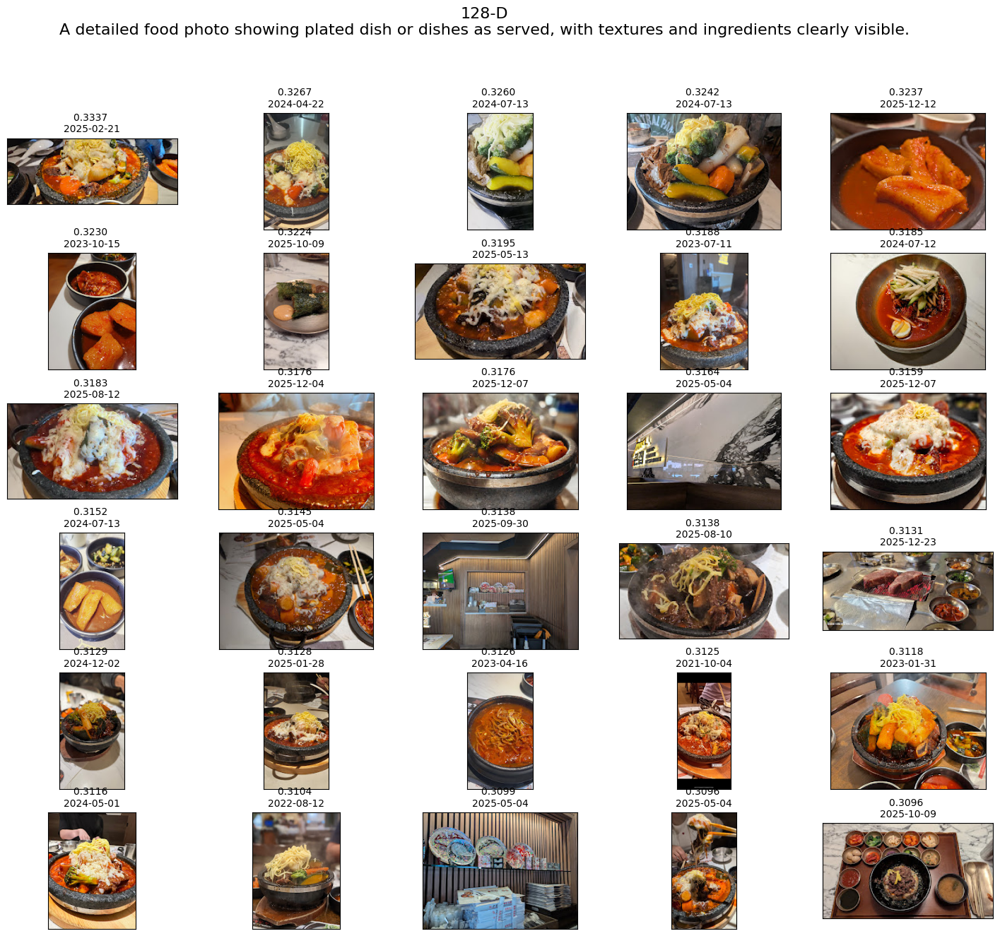

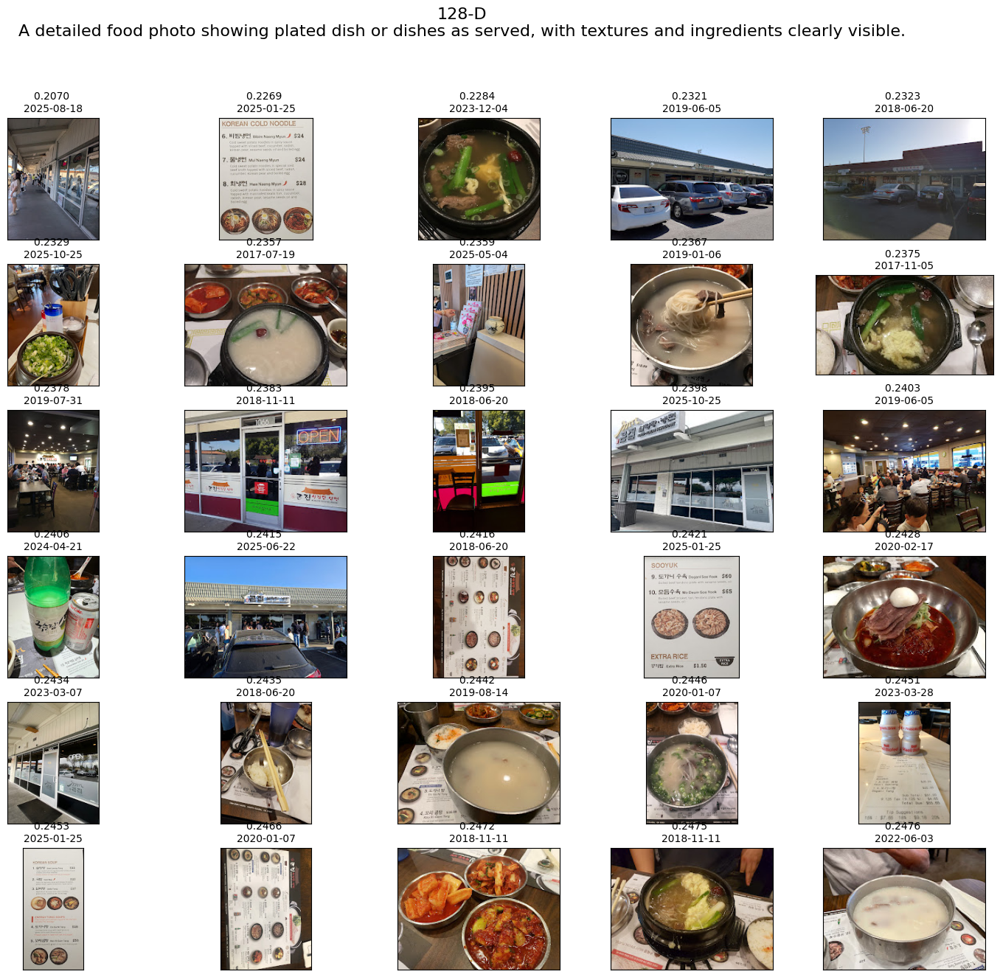

In [129]:
for lst in [top_images, bottom_images]:
    fig, axes = plt.subplots(num_show//5,5, figsize=(num_show//5*3,15))
    for i in range(num_show):
        ax = axes[i//5][i%5]
        ax.set_xticks([])
        ax.set_yticks([])

        img, similarity, published_date = lst[i]
        ax.set_title(f"{similarity:.4f} \n{published_date}", fontsize=10)
       
        ax.imshow(img)
    plt.suptitle(f"{EMBED_DIM}-D\n"+query_text, fontsize=16)
plt.show()


## Show all result(by step) to view distribution

In [73]:
sample_step = 4
lst = []
for i in range(len(df_sorted)//sample_step):
    idx = i * sample_step
    row = df_sorted.iloc[idx]
    response = requests.get(row['image_url'].replace("s=1024","s=200"))
    image = Image.open(BytesIO(response.content))
    lst.append((image, row['similarity']))


print(f"Showing {len(lst)} images, with step size {sample_step} from total {len(df_sorted)}")

Showing 133 images, with step size 4 from total 532


In [76]:
def display_image(actual_idx):
    img, score = lst[actual_idx // sample_step]
    print(f"Rank: {actual_idx + 1} | Similarity Score: {score:.4f} | Size: {img.size}")
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    # Force axes to have equal physical dimensions (square)
    ax1.set_box_aspect(1)
    ax2.set_box_aspect(1)
    
    # Display image; aspect='auto' fills the square, 'equal' keeps proportions within the square
    ax1.imshow(img, aspect='equal')
    ax1.axis('off')
    
    ax2.plot(similarities, color='blue', alpha=0.6)
    ax2.scatter(actual_idx, similarities[actual_idx], color='red', s=50, label='Current Item')
    # ax2.bar(range(len(similarities)), similarities, color='blue', alpha=0.6)
    # ax2.bar(actual_idx, similarities[actual_idx], color='red', alpha=0.6)
    ax2.set_title(f"Similarity Scores (D={EMBED_DIM})")
    
    ax2.set_ylim(min(similarities), max(similarities))
    ax2.grid(True, linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.show()

widgets.interact(
    display_image, 
    actual_idx=widgets.IntSlider(
        min=0, 
        max=(len(lst) - 1) * sample_step, 
        step=sample_step, 
        value=0, 
        description='Sample Index:'
    )
)

interactive(children=(IntSlider(value=0, description='Sample Index:', max=528, step=4), Output()), _dom_classe…

<function __main__.display_image(actual_idx)>

In [127]:
# for i in range(300,310):
i=9
print(df_sorted.iloc[i]['image_url']+"=s0")
print(df_sorted.iloc[i]['published_date'])

https://lh3.googleusercontent.com/geougc-cs/AMBA38sTlyW-LB9rSeoaRnS176XBFRlsOmama5fpF-ES_xeA5ORmXkJpfEoh8YWk-6iI0s1r_eSQN4w0pr38xUy1yV97xPUldzQ7L-vmyLPwWNKi3_prNxRBQUPIToRCfuoSoDBCYWVn=s0
2024-08-30


# Clustering 10 menu board candidates

In [185]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import normalize

In [188]:
X = np.array([l for l in df_sorted[:10][get_column_name(EMBED_DIM)].values])
print(X.shape)
X_norm = normalize(X)

# cluster_model = AgglomerativeClustering(
#     n_clusters=None, 
#     distance_threshold=0.3, 
#     metric='euclidean', 
#     linkage='average'
# )
cluster_model = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')


labels = cluster_model.fit_predict(X_norm)
from collections import defaultdict
clusters = defaultdict(list)
for i in range(len(labels)):
    date = df_sorted.iloc[i]['published_date']
    url = df_sorted.iloc[i]['image_url']+"=s0"
    clusters[labels[i]].append((str(date), url))

# four_images = []
# for label in set(labels):
#     print(f"\ncluster {label}")
#     for item in clusters[label]:
#         print(item)
#     four_images.append(sorted(clusters[label], key=lambda x: x[0], reverse=True)[0][1])

(10, 128)


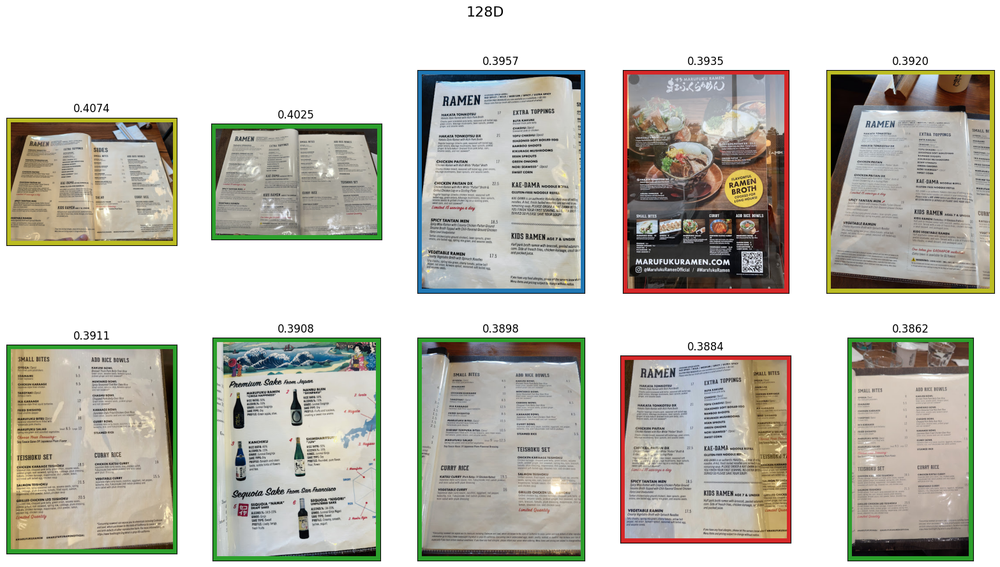

In [189]:
color_by_label = {
    0: '#2ca02c',  # tab:green
    1: '#d62728',  # tab:red
    2: '#1f77b4',  # tab:blue
    3: '#bcbd22',  # tab:olive (yellow-ish)
    4: '#ff7f0e',  # tab:orange
    5: '#9467bd',  # tab:purple
    6: '#17becf',  # tab:cyan
    7: '#e377c2',  # tab:pink
    8: '#8c564b',  # tab:brown
    9: '#7f7f7f'   # tab:gray
}
fig, axes = plt.subplots(2,5, figsize=(20,10))
for i in range(10):
    ax = axes[i//5][i%5]
    ax.set_xticks([])
    ax.set_yticks([])

    img, similarity = top_images[i]
    label = labels[i]
    ax.set_title(f"{similarity:.4f}")
   
    ax.imshow(img)
    rect = patches.Rectangle((0, 0), img.size[0], img.size[1], 
                         linewidth=10, edgecolor=color_by_label[label], facecolor='none')
    ax.add_patch(rect)


plt.suptitle(f"{EMBED_DIM}D", fontsize=16)
plt.show()

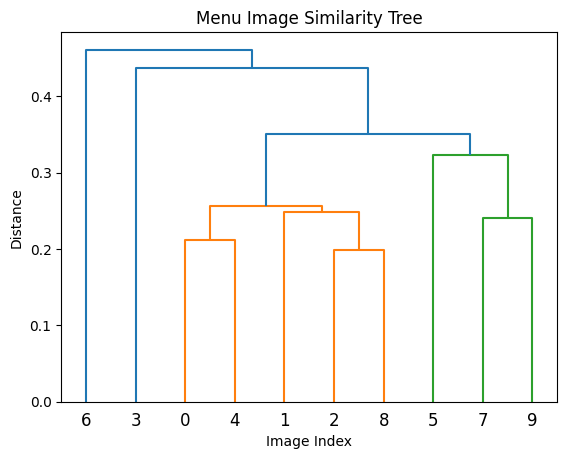

In [182]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt
Z = linkage(X_norm, method='average')
dendrogram(Z)
plt.title("Menu Image Similarity Tree")
plt.xlabel("Image Index")
plt.ylabel("Distance")
plt.show()

In [66]:
from PIL import Image
import requests
from io import BytesIO

def create_image_collage(image_sources, output_path="collage.jpg"):
    """
    Stitches four images into a 2x2 grid.
    image_sources: List of 4 URLs or local file paths.
    """
    images = []
    
    for src in image_sources:
        if src.startswith(('http://', 'https://')):
            response = requests.get(src, timeout=10)
            img = Image.open(BytesIO(response.content))
        else:
            img = Image.open(src)
        images.append(img.convert("RGB"))

    tile_size = 800
    resized_images = []
    for img in images:
        img.thumbnail((tile_size, tile_size), Image.Resampling.LANCZOS)
        tile = Image.new('RGB', (tile_size, tile_size), (0, 0, 0))
        tile.paste(img, ((tile_size - img.width) // 2, (tile_size - img.height) // 2))
        resized_images.append(tile)
    canvas = Image.new('RGB', (tile_size * 2, tile_size * 2))

    # 4. Paste into grid
    canvas.paste(resized_images[0], (0, 0))              # Top Left
    canvas.paste(resized_images[1], (tile_size, 0))      # Top Right
    canvas.paste(resized_images[2], (0, tile_size))      # Bottom Left
    canvas.paste(resized_images[3], (tile_size, tile_size)) # Bottom Right
    canvas.save(output_path, quality=95)
    return output_path

create_image_collage(four_images)

'collage.jpg'

# Filter non-food images

In [110]:
place_id = place_ids[2]
restaurant_name = PID_RNAME_MAPPING.get(place_id, "Unknown_Restaurant")
parquet_path = PROJECT_ROOT / "data" / "byproduct" / "11-embeddings" / f"{place_id}.parquet"
df = pd.read_parquet(parquet_path)
print(f"Found {len(df)} rows for {restaurant_name} (pid={place_id})")

df.head()

Found 532 rows for Marufuku Ramen Cupertino (pid=ChIJw1N0TPq1j4ARiWgSpsEurvo)


,place_id,image_url,published_date,embedding_128
0,ChIJw1N0TPq1j4ARiWgSpsEurvo,https://lh3.googleusercontent.com/geougc-cs/AM...,2026-01-01,"[0.105737209, 0.00148115645, -0.0962469652, -0..."
1,ChIJw1N0TPq1j4ARiWgSpsEurvo,https://lh3.googleusercontent.com/geougc-cs/AM...,2026-01-01,"[0.102743298, 0.0177104138, -0.0952292085, 0.0..."
2,ChIJw1N0TPq1j4ARiWgSpsEurvo,https://lh3.googleusercontent.com/geougc-cs/AM...,2026-01-01,"[0.0622317418, -0.0752668902, -0.0414018, 0.03..."
3,ChIJw1N0TPq1j4ARiWgSpsEurvo,https://lh3.googleusercontent.com/geougc-cs/AM...,2026-01-01,"[0.110743232, -0.0463721193, -0.0513966195, 0...."
4,ChIJw1N0TPq1j4ARiWgSpsEurvo,https://lh3.googleusercontent.com/geougc-cs/AM...,2026-01-01,"[0.103853889, -0.0848939791, -0.0909437165, 0...."


In [111]:
EMBED_DIM = 128
for query_purpose, query_info in QUERIES.items():
    print(f"Calculating {query_purpose} similarity... <<{query_info['text']}>>")
    query_text = query_info['text']
    query_embedding = np.array(query_info['vector'])

    df[f"{query_purpose}_similarity"] = cosine_similarity(
        np.stack(df[f"embedding_{EMBED_DIM}"].values), 
        query_embedding.reshape(1, -1)
    ).flatten()
print(df.columns)

Calculating is_menu similarity... <<A photo of a full restaurant menu showing all menu items and prices, with the entire menu visible in frame and little surrounding background, organized for customer ordering.>>
Calculating is_interior similarity... <<An overview image of a restaurant dining space capturing the interior layout and ambiance.>>
Calculating is_exterior similarity... <<A street-level view of a restaurant exterior with the storefront, entrance, and clearly visible restaurant logo or sign.>>
Calculating is_food similarity... <<A detailed food photo showing plated dish or dishes as served, with textures and ingredients clearly visible.>>
Index(['place_id', 'image_url', 'published_date', 'embedding_128',
       'is_menu_similarity', 'is_interior_similarity',
       'is_exterior_similarity', 'is_food_similarity'],
      dtype='object')


In [112]:
query_text = (
    "A food photo focused on a grilled, fried, or baked dish served on a plate."
)
query_embedding = mm_embedding_model.get_embeddings(
    contextual_text=query_text,
    dimension=EMBED_DIM
).text_embedding
query_embedding = np.array(query_embedding)

df[f"is_food2_similarity"] = cosine_similarity(
    np.stack(df[f"embedding_{EMBED_DIM}"].values), 
    query_embedding.reshape(1, -1)
).flatten()

In [113]:
threshold = 0.33
before_n = len(df)
print(f"Before filtering, total rows: {before_n}")

df['max_nonfood_similarity'] = df[['is_menu_similarity', 'is_exterior_similarity', 'is_interior_similarity']].max(axis=1)

food_idx1 = (
    (df['max_nonfood_similarity'] < threshold)
)
# food_idx2 = (
#     (df['is_food2_similarity'] > 0.3) &
#     (df['is_food2_similarity'] > df['is_menu_similarity']-0.2)
# )
food_idx2 = (
    (df['is_food_similarity'] > 0.3) &
    (df['is_food_similarity'] > df['is_menu_similarity']-0.2)
)
print(f"{len(df[food_idx1])}, {len(df[food_idx2])} -> {len(df[food_idx1 | food_idx2])}")

filtered_df = df[food_idx1 | food_idx2].reset_index(drop=True)

print(f"After filtering, total rows: {len(filtered_df)}")

Before filtering, total rows: 532
446, 339 -> 467
After filtering, total rows: 467


In [98]:
images = []
# for row_idx in df[~(food_idx1 | food_idx2)].index:
for row_idx in df[~food_idx1 & food_idx2].index:
    row = df.iloc[row_idx]
    is_food_sim = row['is_food_similarity']
    is_food2_sim = row["is_food2_similarity"]
    # response = requests.get(row['image_url'].replace("=s1024","=s200"))
    # image = Image.open(BytesIO(response.content))
    # images.append((image, is_food_sim))

    if is_food2_sim > 0.3:
        print(f"{max(row['is_menu_similarity'], row['is_exterior_similarity'], row['is_interior_similarity']):.3f} | {row['is_menu_similarity']:.3f}|  {is_food_sim:.3f} {is_food2_sim:.3f} | {row['image_url']}")

0.332 | 0.332|  0.314 0.304 | https://lh3.googleusercontent.com/geougc-cs/AMBA38s8ly9YRfuVBTLxe9ws1-yLmtQVUvtno0z1dKs1mkKNHeczBWNrIar5GtQXV1WJYUEonMBUuykTy1cxTvdvsoCTFBT9WZGiCjWbYGNWBH11oeNoJLhU5E4nnWoSQzo-2hCQkFM=s1024
0.332 | 0.332|  0.312 0.317 | https://lh3.googleusercontent.com/geougc-cs/AMBA38sdd133IESYDdrC_Bt89uhGJaj_7-Bk5HML39whoyS9elcIuYB6uE4jb5N4qiQWEYYqK294JhEBcZcy0OURBFtO8yVYi2P66V_iWCSde012bGGVKlcYrZWE0jSFNAuKbfNYLaQ=s1024
0.331 | 0.331|  0.309 0.323 | https://lh3.googleusercontent.com/geougc-cs/AMBA38vUHOyCn16_6QnIE_GLAI_xHeZcyb9cndrMjSxTmq-VJmkM52zWx0pmPDQB2naFRfVrY6aTANNBLG1fINhEbTwPu66Nkt_mgBiwpB8ynwruERZpqVRMr-aW5SGc_HSxe3YJq8pQ=s1024


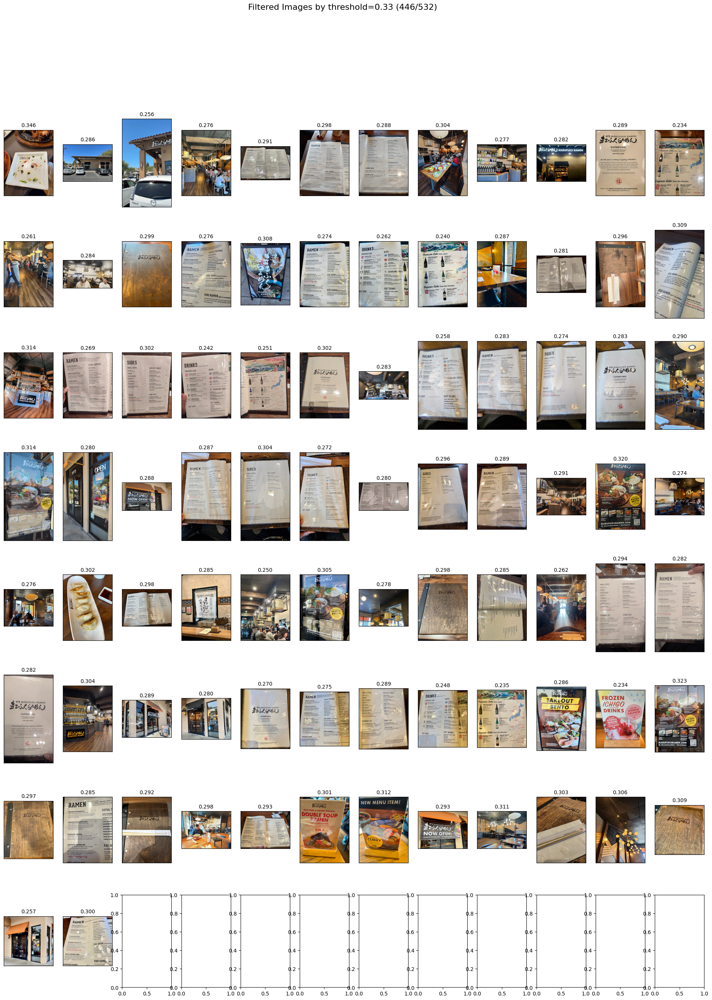

In [63]:
m = 12
fig, axes = plt.subplots(len(images)//m + 1,m, figsize=((len(images)//m + 1)*3,30))
for i in range(len(images)):
    ax = axes[i//m][i%m]
    ax.set_xticks([])
    ax.set_yticks([])

    img, is_food_sim = images[i]
    ax.set_title(f"{is_food_sim:.3f}", fontsize=10)
   
    ax.imshow(img)
plt.suptitle(f"Filtered Images by threshold={threshold} ({before_n-len(images)}/{before_n})", fontsize=16)
plt.show()